In [153]:
import matplotlib.pyplot as plt
from scipy import signal
from scipy.io import wavfile
import os
import IPython
import math
import numpy as np
from scipy.signal import medfilt
import sympy
sympy.init_printing()

In [103]:
base_dir="AudioFiles"
file_1="Degussy - Etude pour les huit doigts.wav"
file_2="Santoro - Paulistana 1.wav"
file_3="Scarlatti - Sonata in A minor, KK 188-inicio.wav"

# Crackle noise

Degussy - Etude pour les huit doigts

In [104]:
file_path = os.path.join(base_dir,file_1)
sample_rate,samples = wavfile.read(file_path)
total_time = 1.0*samples.shape[0]/sample_rate
time = np.array(range(samples.shape[0]))*total_time/samples.shape[0]
sample_rate
IPython.display.Audio(samples[:220000],rate=sample_rate)

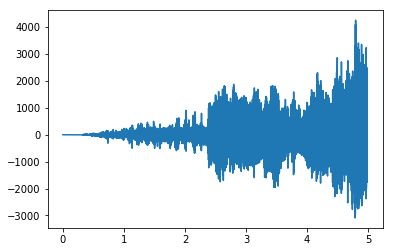

In [105]:
plt.plot(time[:220000],samples[:220000])
plt.show()

In [106]:
time = np.array(range(samples.shape[0]))*samples.shape[0]*1/(1.0*samples.shape[0]/sample_rate)

In [107]:
median_filtered = medfilt(samples,kernel_size=33)
IPython.display.Audio(median_filtered,rate=sample_rate)

In [129]:

def get_X(x,I):
    """
    construct X matrix for autoregressive model as defined in page 34 of
    the thesis
    """
    x_extended = np.zeros((x.shape[0],I))
    X = np.zeros((x.shape[0]-I,I))
    for i in range(I):
        #define selector for each line
        X[:,i] = x[I-i-1:(x.shape[0] -1 - i),0]
    return X

In [142]:
def autoregressive_matrix(x,I):
    """
    Calculate autoregressive model of I coefficients from signal x using LS method
    to minimize the prediction error energy
    """
    X = get_X(x,I)
    print(type(X))
    print(X.shape)
    print(X)
    X_t = np.transpose(X)
    x_i = x[I:]
    print(x_i.shape)
    a = np.matmul(X_t,X)
    print(a.shape)
    b = np.linalg.inv(a)
    print(b.shape)
    c = np.matmul(b,X_t)
    print(c.shape)
    a_ls = np.matmul(c,x_i)
    return a_ls

In [197]:
samples_vector = samples.reshape((samples.shape[0],1))
I = 100
a = autoregressive_matrix(samples_vector[30000:31000],I)

<class 'numpy.ndarray'>
(900, 100)
[[ 17.   7.   8. ... -42. -41. -38.]
 [ 28.  17.   7. ... -53. -42. -41.]
 [ 49.  28.  17. ... -58. -53. -42.]
 ...
 [-32. -39. -24. ...  16.   2.   4.]
 [-10. -32. -39. ...  26.  16.   2.]
 [  9. -10. -32. ...  27.  26.  16.]]
(900, 1)
(100, 100)
(100, 100)
(100, 900)


In [198]:
x_1 = samples_vector[I:,0]

In [199]:
def get_A(a,K):
    """
    construct A matrix as defined in page 124 of the thesis
    """
    I = a.shape[0]
    A = np.zeros([K-I,K])
    for i in range(K-I):
        A[i,i:i+I+1] = -1*a
        A[i+I] = 0
    return A

In [200]:
s, z = sympy.symbols('s, z')
k = sympy.Symbol('k', integer=True)
Dt = sympy.Symbol('\Delta t', positive=True)
aaa = sympy.Sum(1 * z**-k, (k, 0, sympy.oo))

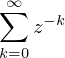

In [201]:
aaa

In [202]:
A_filter = np.zeros([I+1])
A_filter[0]= 1
for i in range(I):
    A_filter[i+1] = -a[i]
A_filter

array([ 1.00000000e+00, -1.17757783e+00,  9.07273339e-01, -1.06430053e+00,
        1.12471122e+00, -9.59656409e-01,  8.34221552e-01, -9.95933176e-01,
        8.37767674e-01, -6.07016328e-01,  5.84803824e-01, -7.82383973e-01,
        4.72823789e-01, -3.10125291e-01,  3.94405724e-01, -2.76288456e-01,
        1.14439610e-03, -2.00090425e-02,  1.08193308e-01,  4.97168385e-02,
       -1.86887984e-01,  4.82636443e-02, -7.08385061e-02,  2.75673283e-01,
       -1.73662608e-01,  7.00214761e-02, -2.37240912e-01,  2.84599440e-01,
       -1.13253230e-01,  9.71664311e-02, -1.83336512e-01,  6.88140454e-02,
        7.15838574e-02,  4.03179826e-02, -3.94345151e-02, -1.25493601e-01,
        1.43909414e-01, -3.63435674e-03,  5.39702256e-02, -1.52470998e-01,
        1.50780329e-02,  9.48529590e-02,  5.35452240e-02, -5.42595414e-02,
       -1.09967287e-01,  6.55411655e-02, -3.67296329e-02,  1.84836718e-01,
       -2.37885504e-01,  1.48734615e-01, -1.90313960e-01,  3.05728922e-01,
       -2.47216139e-01,  

In [230]:
zi = signal.lfilter_zi(A_filter,[1])
e,_ = signal.lfilter(A_filter,[1],samples_vector[30000:30200,0],zi=zi*samples_vector[0,0])

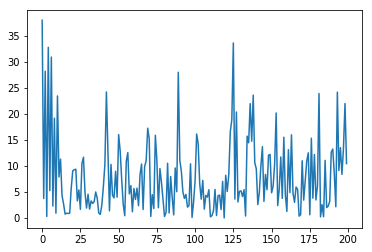

In [231]:
plt.plot(np.abs(e))
plt.show()

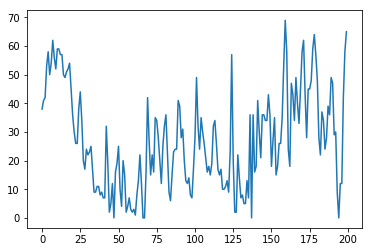

In [232]:
plt.plot(np.abs(samples_vector[30000:30200,0]))
plt.show()

In [212]:
zi.shape

In [214]:
A_filter.shape

In [221]:
type(z)

tuple

In [228]:
def ls_interpolation(A_d,A_c,x_c):
    """
    LS interpolation as defined in page 113 of the thesis
    """
    A_d_t = np.transpose(A_d)
    x_d = np.matmul(np.matmul(np.matmul(np.inv(np.matmul(A_d_t,A_d)),A_d_t),A_c),x_c)
    return x_d

In [233]:
sigma_e = np.std(e)
C = 1
lambda = C*sigma_e

In [ ]:
lam